In [ ]:
import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb

import torch
from torch import nn, optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader


paths = glob.glob("dataset_bilateral_3_resized/10/*.png")  # All paths to images in the dataset


np.random.seed(123)


np.random.shuffle(paths)


train_paths = paths[:16000] 
val_paths = paths[16000:]   

# Print the number of training and test images
print(len(train_paths), len(val_paths))  # Output: (16000, 1736)


16000 1736


In [21]:
SIZE = 64
class ColorizationDataset(Dataset):
    def __init__(self, paths, split='train'):
        if split == 'train':
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE),  Image.BICUBIC),
                transforms.RandomHorizontalFlip(), # A little data augmentation!
            ])
        elif split == 'val':
            self.transforms = transforms.Resize((SIZE, SIZE),  Image.BICUBIC)
        
        self.split = split
        self.size = SIZE
        self.paths = paths
    
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        img_lab = rgb2lab(img).astype("float32") # Converting RGB to L*a*b
        img_lab = transforms.ToTensor()(img_lab)
        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1
        
        return {'L': L, 'ab': ab}
    
    def __len__(self):
        return len(self.paths)

def make_dataloaders(batch_size=16, n_workers=4, pin_memory=True, **kwargs): # A handy function to make our dataloaders
    dataset = ColorizationDataset(**kwargs)
    dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=n_workers,
                            pin_memory=pin_memory)
    return dataloader

train_dl = make_dataloaders(paths=train_paths, split='train')
val_dl = make_dataloaders(paths=val_paths, split='val')

data = next(iter(train_dl))
Ls, abs_ = data['L'], data['ab']
print(Ls.shape, abs_.shape)
print(len(train_dl), len(val_dl))

torch.Size([16, 1, 64, 64]) torch.Size([16, 2, 64, 64])
1000 109


In [ ]:
import torch
import torch.nn as nn

class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf

        downconv = nn.Conv2d(input_c, ni, kernel_size=3, stride=1, padding=0, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)
        
        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=3, stride=1, padding=0)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]  # For final output
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=3, stride=1, padding=0, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=3, stride=1, padding=0, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)
    
    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=4, num_filters=64):
       
        super().__init__()

 
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)

        
        for _ in range(n_down - 3):  
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)

        
        out_filters = num_filters * 8
        for _ in range(2):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2

        
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)

    def forward(self, x):
        return self.model(x)



In [ ]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2) 
                          for i in range(n_down)] 
                                                
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] 
                                                                                             
        self.model = nn.Sequential(*model)                                                   
        
    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): 
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

In [7]:
print(PatchDiscriminator(input_c=3))  

PatchDiscriminator(
  (model): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (

In [ ]:
discriminator = PatchDiscriminator(3)
dummy_input = torch.randn(64, 3, 64, 64) 
out = discriminator(dummy_input)
out.shape

torch.Size([64, 1, 6, 6])

In [9]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()
    
    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)
    
    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

In [ ]:
def init_weights(net, init='norm', gain=0.02):
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            
            
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)

    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

In [11]:
def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

In [12]:
class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4, 
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()
        
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1
        
        if net_G is None:
            self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=3, num_filters=64), self.device)
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.L1criterion = nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))
    
    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad
        
    def setup_input(self, data):
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)
        
    def forward(self):
        self.fake_color = self.net_G(self.L)
    
    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()
    
    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()
    
    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()
        
        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

model = MainModel()

model initialized with norm initialization
model initialized with norm initialization


In [13]:
import time

import numpy as np
from skimage.color import rgb2lab, lab2rgb
import matplotlib.pyplot as plt

import torch


class AverageMeter:
    def __init__(self):
        self.reset()

    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3

    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

In [14]:
def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()

    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

In [15]:
def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

In [ ]:
def lab_to_rgb(L, ab):
   

    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)

In [ ]:
import matplotlib.pyplot as plt
import time

def visualize(model, data, save=True):
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    
    model.net_G.train()
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    
   
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)

 
    fig, axes = plt.subplots(3, 5, figsize=(15, 8))


    batch_size = min(5, L.size(0))  
    for i in range(batch_size):
    
        axes[0, i].imshow(L[i][0].cpu(), cmap='gray')
        axes[0, i].axis("off")

        
        axes[1, i].imshow(fake_imgs[i])
        axes[1, i].axis("off")

       
        axes[2, i].imshow(real_imgs[i])
        axes[2, i].axis("off")

    plt.show()
    
    if save:
        fig.savefig(f"colorization_{time.time()}.png")


In [18]:
def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 1/100
Iteration 500/1000
loss_D_fake: 0.38772
loss_D_real: 0.39511
loss_D: 0.39142
loss_G_GAN: 2.36311
loss_G_L1: 2.66432
loss_G: 5.02743


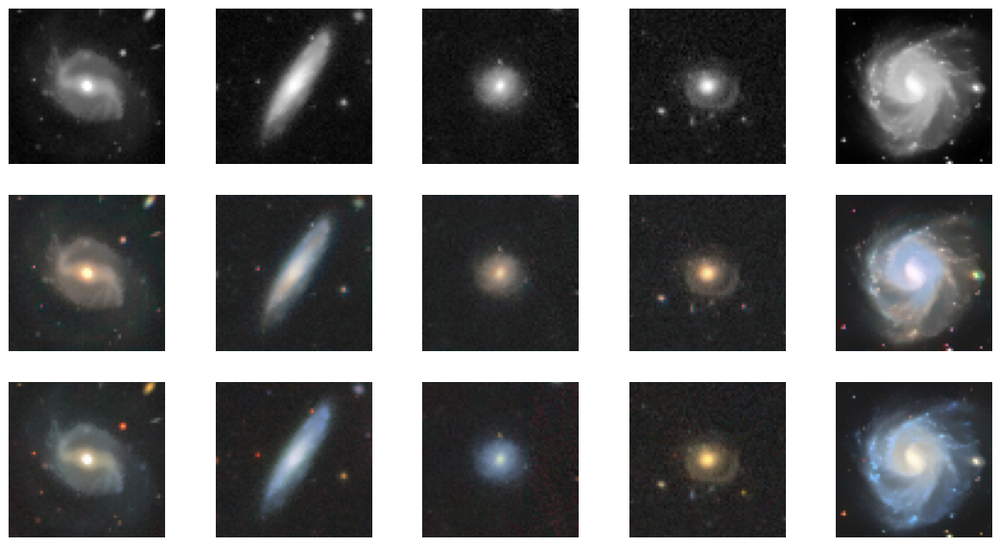


Epoch 1/100
Iteration 1000/1000
loss_D_fake: 0.40237
loss_D_real: 0.41057
loss_D: 0.40647
loss_G_GAN: 2.31338
loss_G_L1: 2.64197
loss_G: 4.95535


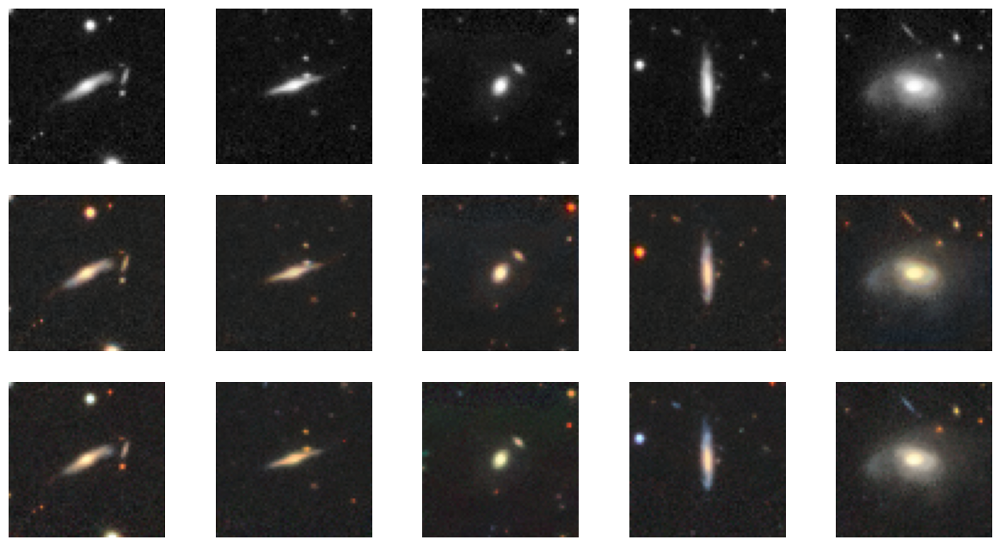

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 2/100
Iteration 500/1000
loss_D_fake: 0.43528
loss_D_real: 0.44478
loss_D: 0.44003
loss_G_GAN: 2.20375
loss_G_L1: 2.61183
loss_G: 4.81559


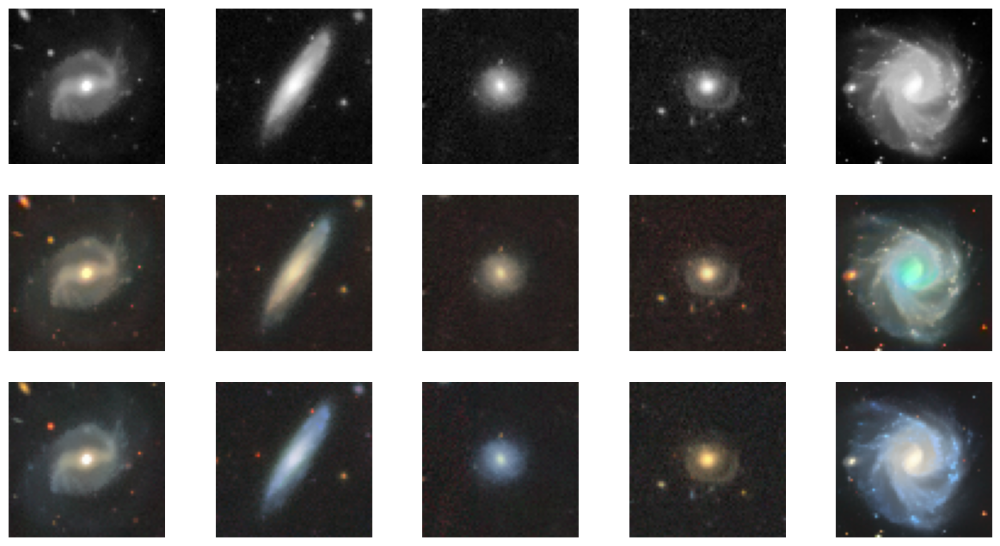


Epoch 2/100
Iteration 1000/1000
loss_D_fake: 0.50751
loss_D_real: 0.51364
loss_D: 0.51057
loss_G_GAN: 1.88968
loss_G_L1: 2.58038
loss_G: 4.47006


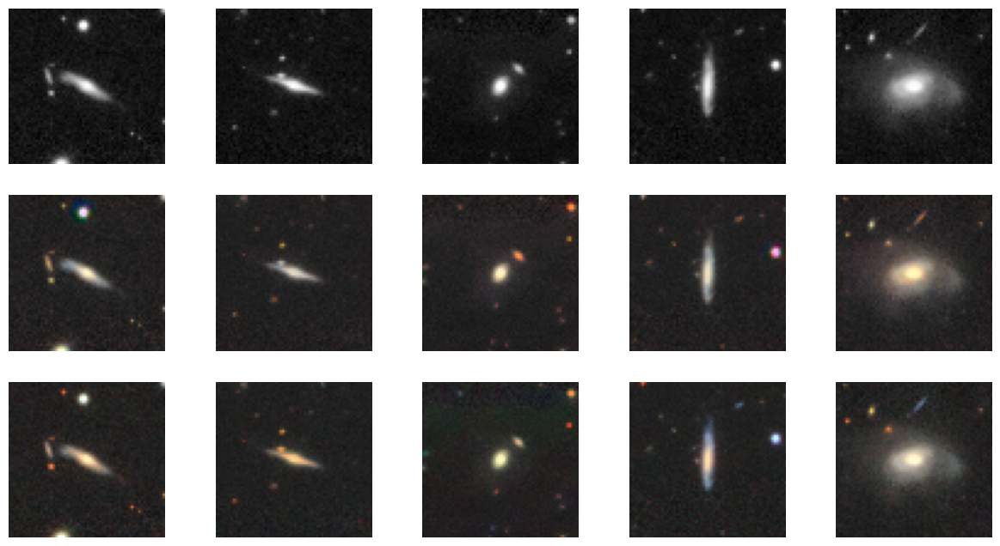

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 3/100
Iteration 500/1000
loss_D_fake: 0.60414
loss_D_real: 0.61569
loss_D: 0.60992
loss_G_GAN: 1.29631
loss_G_L1: 2.55102
loss_G: 3.84733


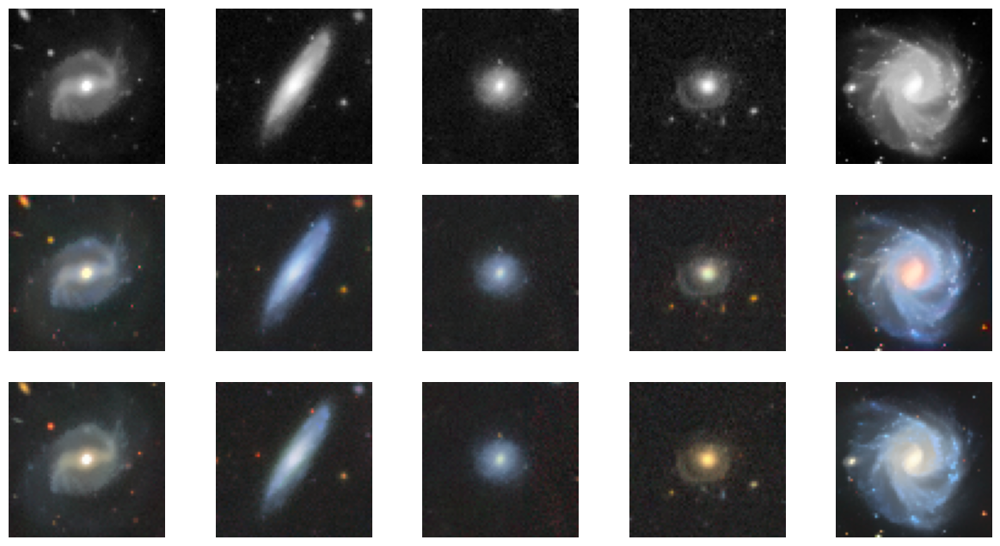


Epoch 3/100
Iteration 1000/1000
loss_D_fake: 0.61165
loss_D_real: 0.62166
loss_D: 0.61665
loss_G_GAN: 1.24665
loss_G_L1: 2.54929
loss_G: 3.79594


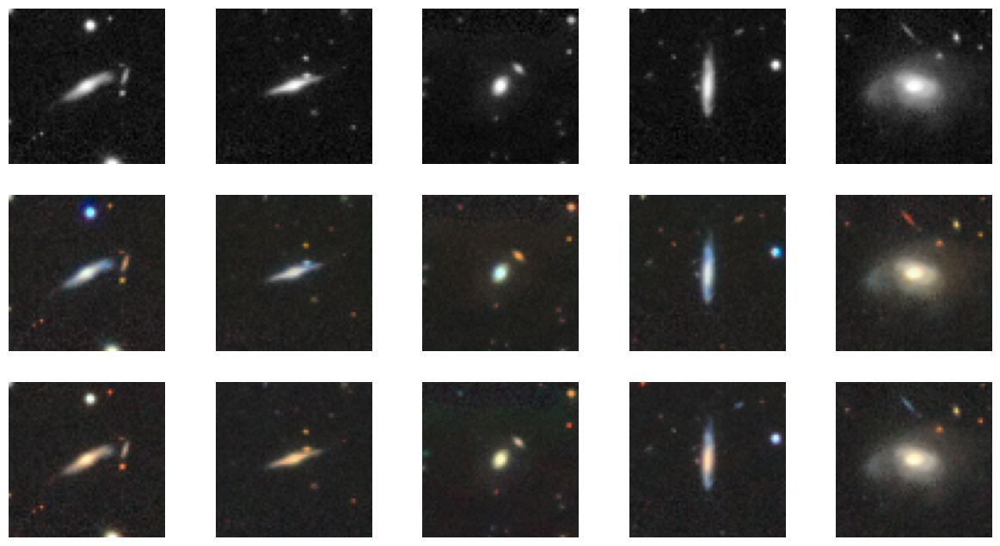

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 4/100
Iteration 500/1000
loss_D_fake: 0.57180
loss_D_real: 0.57944
loss_D: 0.57562
loss_G_GAN: 1.32590
loss_G_L1: 2.56366
loss_G: 3.88955


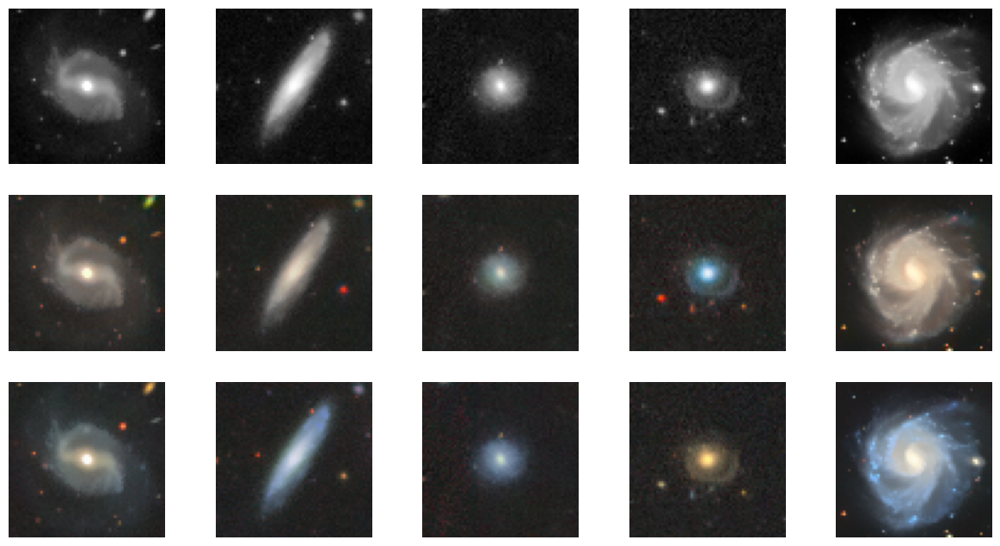


Epoch 4/100
Iteration 1000/1000
loss_D_fake: 0.47993
loss_D_real: 0.48700
loss_D: 0.48347
loss_G_GAN: 1.72594
loss_G_L1: 2.60222
loss_G: 4.32816


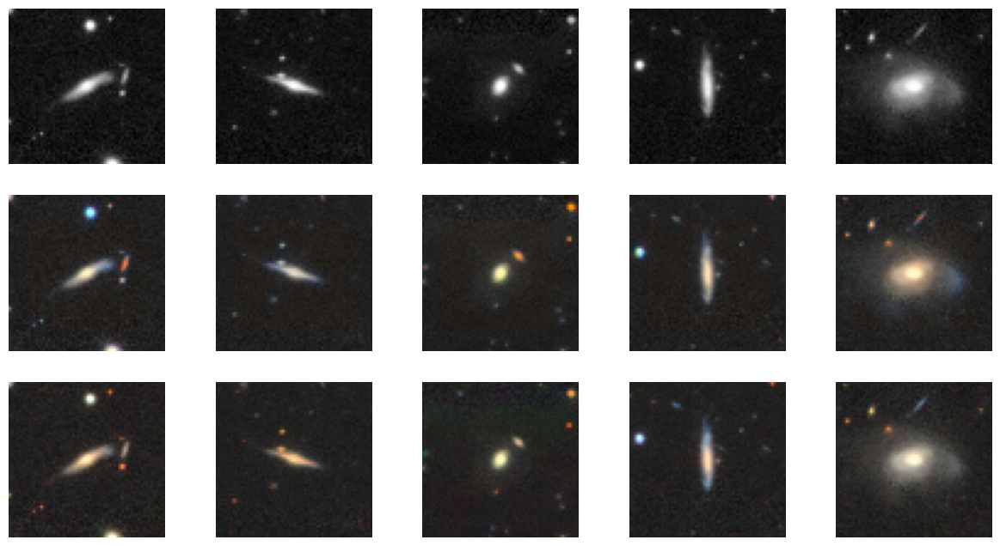

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 5/100
Iteration 500/1000
loss_D_fake: 0.36396
loss_D_real: 0.37749
loss_D: 0.37072
loss_G_GAN: 2.33530
loss_G_L1: 2.68335
loss_G: 5.01866


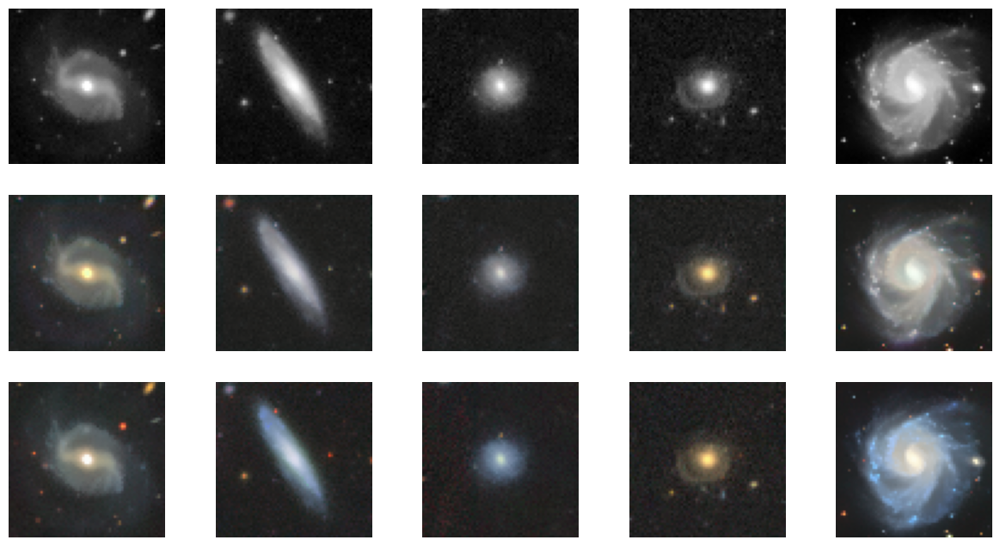


Epoch 5/100
Iteration 1000/1000
loss_D_fake: 0.37406
loss_D_real: 0.38300
loss_D: 0.37853
loss_G_GAN: 2.35007
loss_G_L1: 2.66443
loss_G: 5.01451


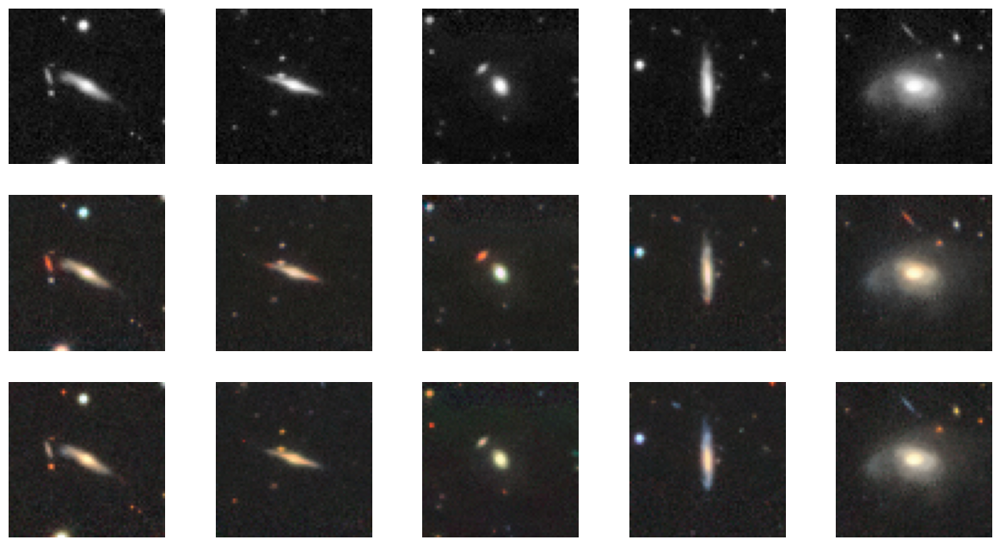

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 6/100
Iteration 500/1000
loss_D_fake: 0.42050
loss_D_real: 0.42821
loss_D: 0.42436
loss_G_GAN: 2.16075
loss_G_L1: 2.66763
loss_G: 4.82838


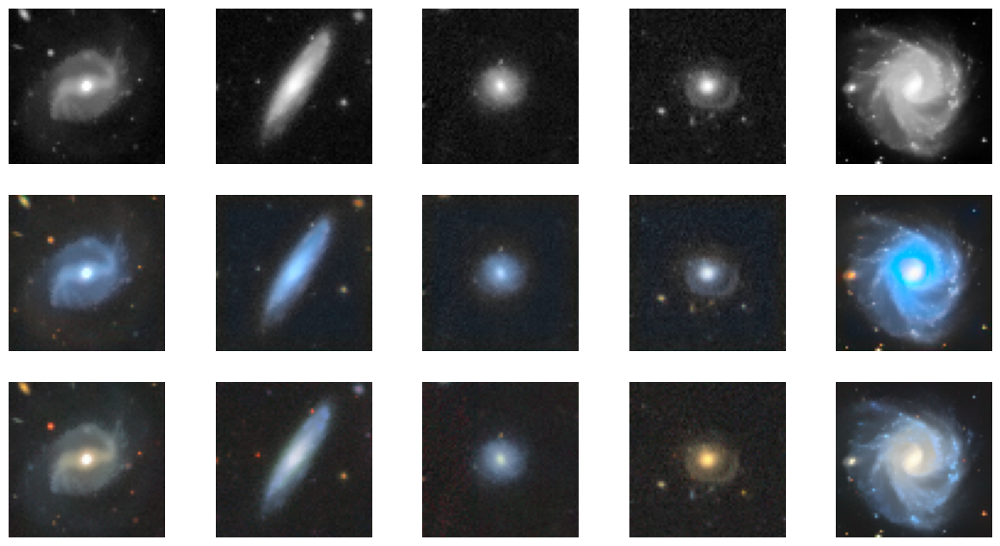


Epoch 6/100
Iteration 1000/1000
loss_D_fake: 0.43019
loss_D_real: 0.43667
loss_D: 0.43343
loss_G_GAN: 2.14646
loss_G_L1: 2.66322
loss_G: 4.80968


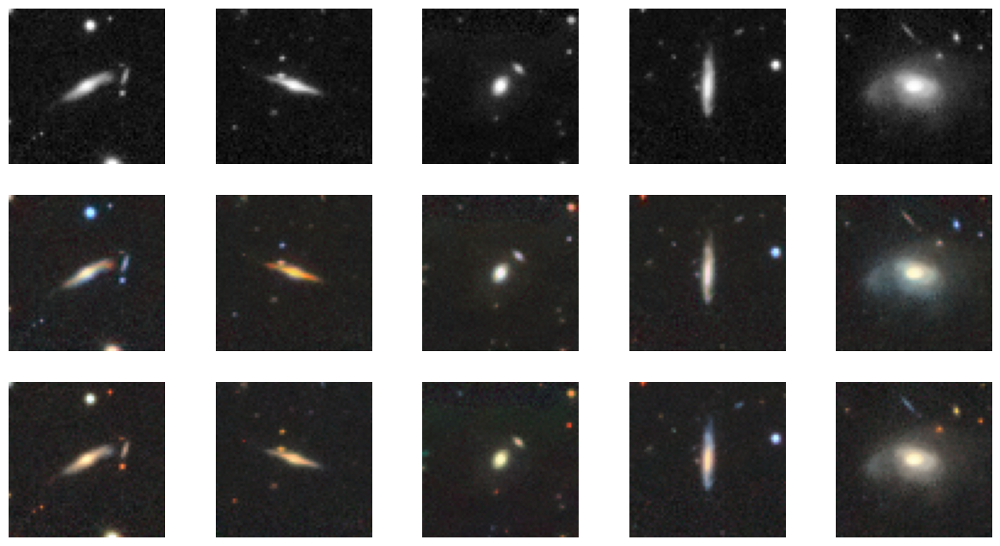

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 7/100
Iteration 500/1000
loss_D_fake: 0.42551
loss_D_real: 0.43119
loss_D: 0.42835
loss_G_GAN: 2.15018
loss_G_L1: 2.62484
loss_G: 4.77502


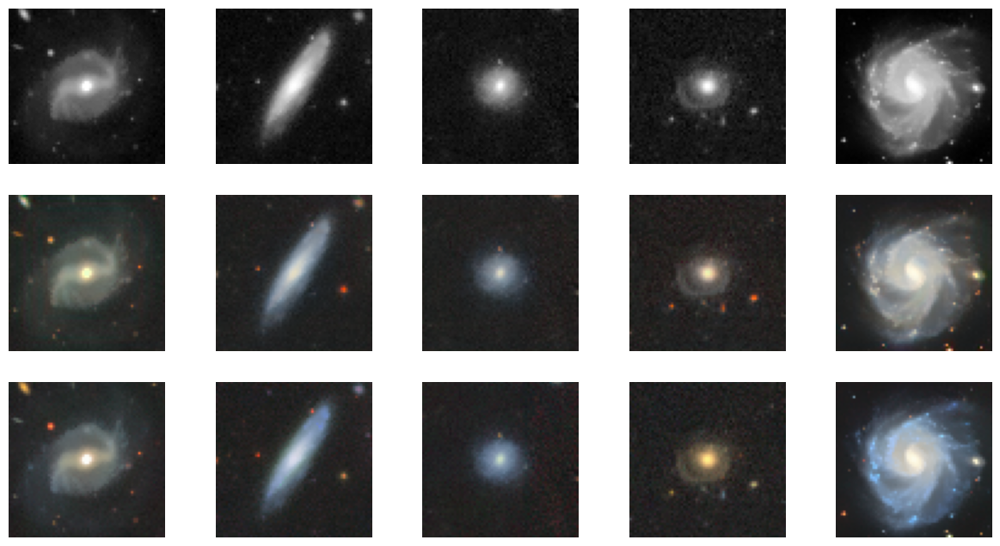


Epoch 7/100
Iteration 1000/1000
loss_D_fake: 0.42378
loss_D_real: 0.42725
loss_D: 0.42551
loss_G_GAN: 2.17921
loss_G_L1: 2.63632
loss_G: 4.81552


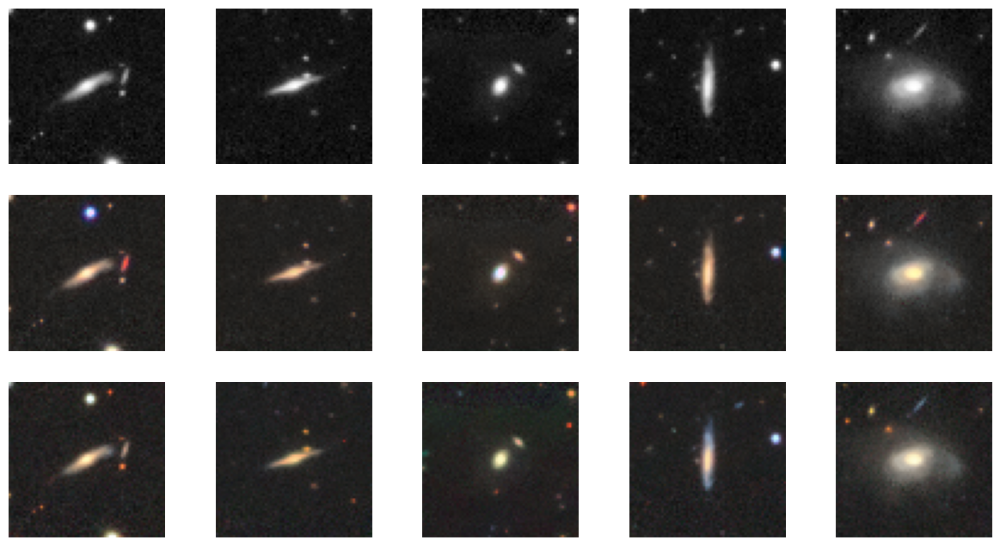

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 8/100
Iteration 500/1000
loss_D_fake: 0.42862
loss_D_real: 0.43599
loss_D: 0.43231
loss_G_GAN: 2.12081
loss_G_L1: 2.62945
loss_G: 4.75026


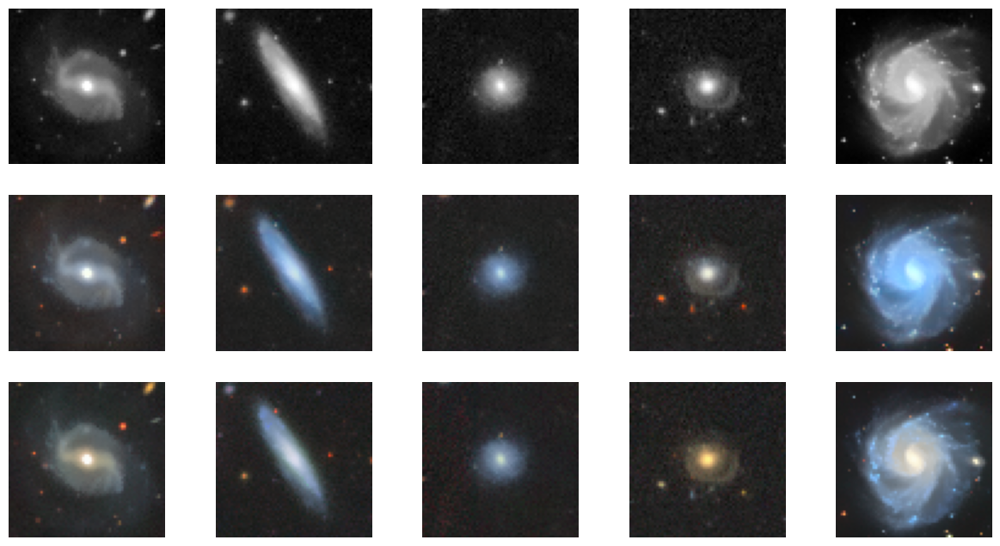


Epoch 8/100
Iteration 1000/1000
loss_D_fake: 0.44862
loss_D_real: 0.46526
loss_D: 0.45694
loss_G_GAN: 2.06172
loss_G_L1: 2.61475
loss_G: 4.67647


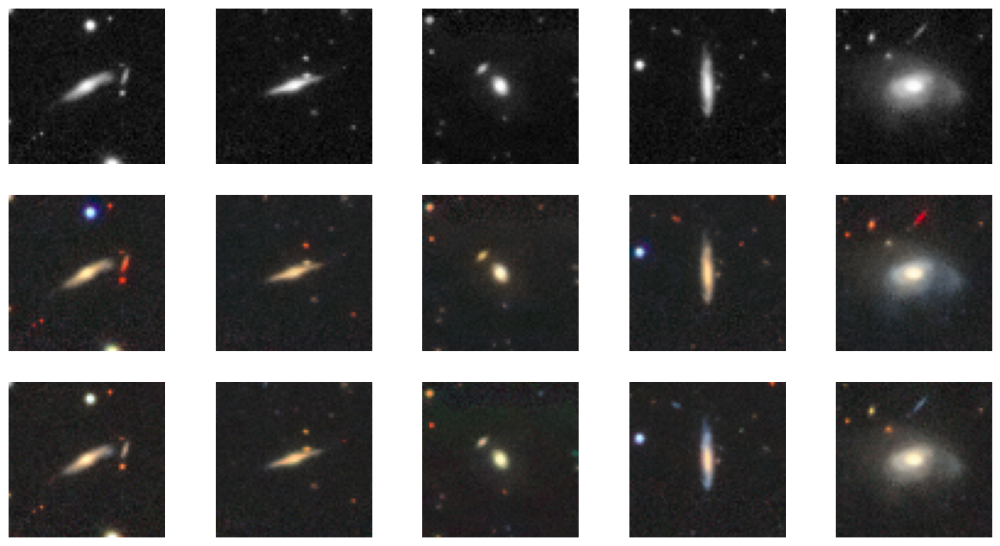

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 9/100
Iteration 500/1000
loss_D_fake: 0.49767
loss_D_real: 0.50410
loss_D: 0.50089
loss_G_GAN: 1.86968
loss_G_L1: 2.60443
loss_G: 4.47411


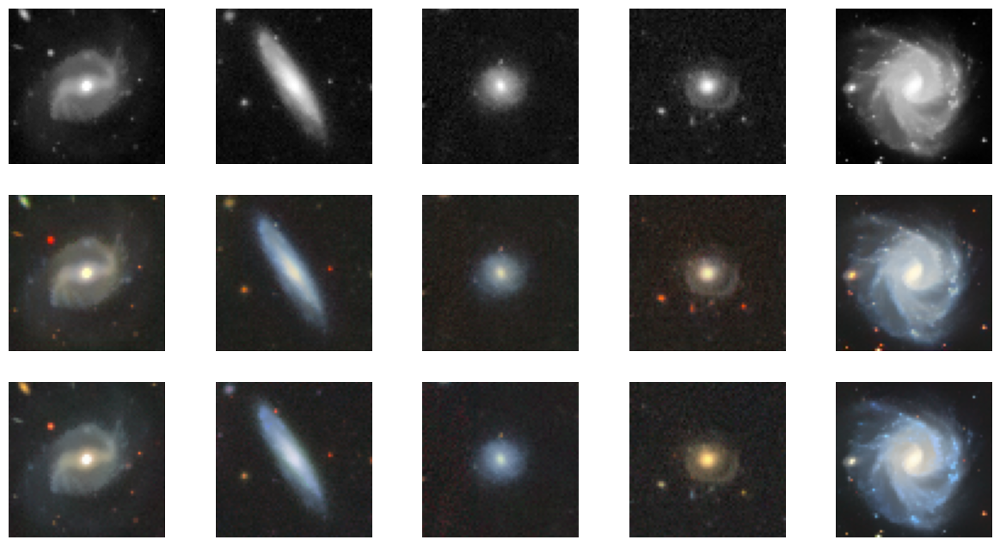


Epoch 9/100
Iteration 1000/1000
loss_D_fake: 0.51272
loss_D_real: 0.51473
loss_D: 0.51372
loss_G_GAN: 1.79882
loss_G_L1: 2.59486
loss_G: 4.39368


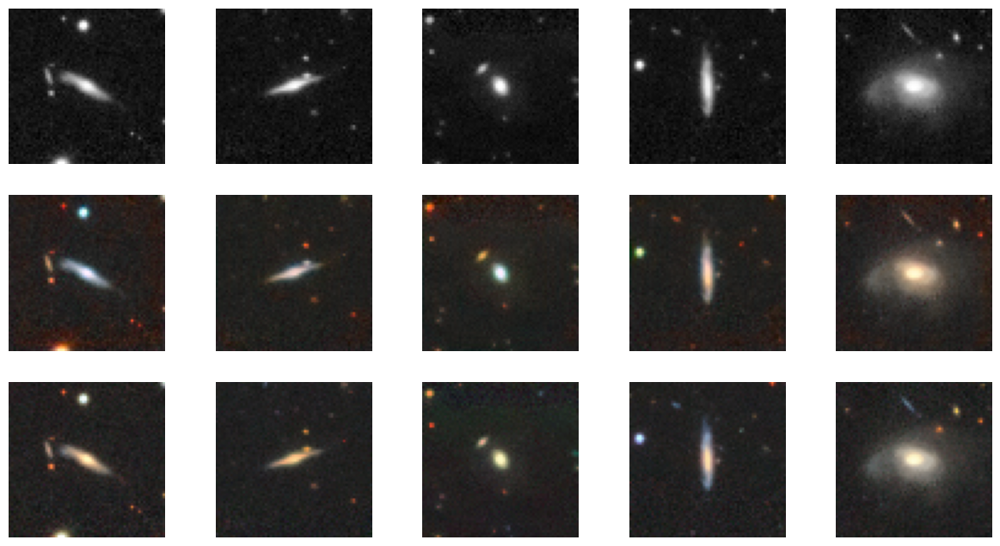

  0%|          | 0/1000 [00:00<?, ?it/s]


Epoch 10/100
Iteration 500/1000
loss_D_fake: 0.48414
loss_D_real: 0.49248
loss_D: 0.48831
loss_G_GAN: 1.85339
loss_G_L1: 2.58551
loss_G: 4.43890


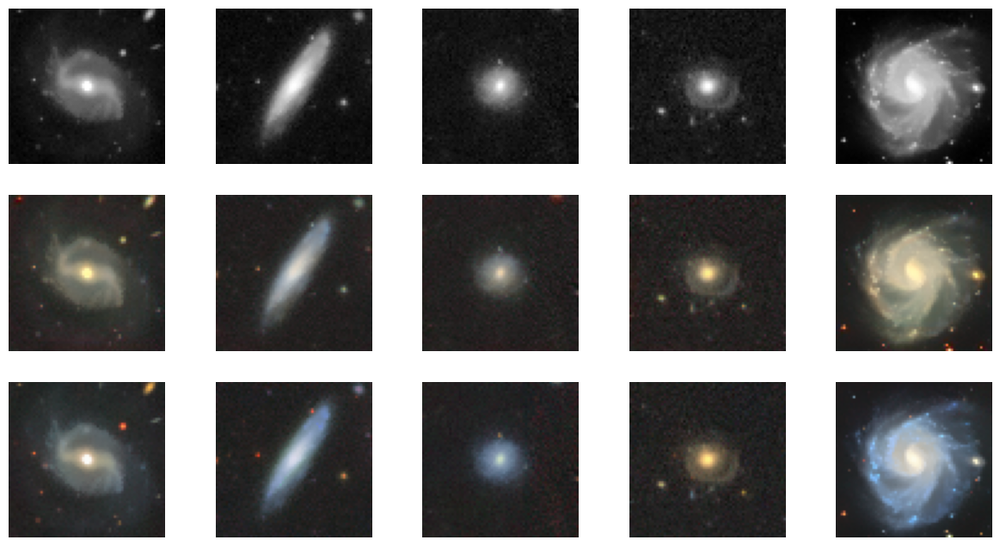

In [ ]:
def train_model(model, train_dl, epochs, display_every=500):
    data = next(iter(val_dl)) 
    for e in range(epochs):
        loss_meter_dict = create_loss_meters() 
        i = 0                                  
        for data in tqdm(train_dl):
            model.setup_input(data) 
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['L'].size(0)) 
            i += 1
            if i % display_every == 0:
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}")
                log_results(loss_meter_dict) 
                visualize(model, data, save=False) 
     
train_model(model, train_dl, 100)

In [1]:
paths = glob.glob("dataset_bilateral_3_resized/10/*.png")



NameError: name 'glob' is not defined

In [ ]:
def test_model(model, val_dl):
    model.net_G.eval()  
    with torch.no_grad():
        for data in tqdm(val_dl):
            print(data)
            model.setup_input(data)
            model.forward()
            fake_color = model.fake_color.detach()
            real_color = model.ab

           
            L = model.L
            fake_imgs = lab_to_rgb(L, fake_color)
            real_imgs = lab_to_rgb(L, real_color)

          
            fig = plt.figure(figsize=(10, 8))
            for i in range(min(5, len(fake_imgs))):  
                ax = plt.subplot(3, 5, i + 1)
                ax.imshow(L[i][0].cpu(), cmap='gray')
                ax.axis("off")
                ax = plt.subplot(3, 5, i + 1 + 5)
                ax.imshow(fake_imgs[i])
                ax.axis("off")
                ax = plt.subplot(3, 5, i + 1 + 10)
                ax.imshow(real_imgs[i])
                ax.axis("off")
            plt.show()
            break  


model = MainModel()

checkpoint = torch.load('/home/asdf/cv/trained_model.pth')
model.load_state_dict(checkpoint['model_state_dict'])

torch.save(model, 'modeln.pth')



test_model(model, val_dl)

NameError: name 'MainModel' is not defined